# 2D Acoustic Wave Equation

This exercise from [seismo-live](https://seismo-live.github.io/) covers the following aspects:

* Presenting you with an implementation of the 2D acoustic wave equation 
* Allowing you to explore the benefits of using high-order finite-difference operators
* Understanding the concepts of stability (Courant criterion)
* Exploration of numerical dispersion and numerical grid anisotropy
* Changing the earth model and exploring some effects of structural heterogeneities (e.g., fault zones)

---

**NOTE**

1. This version is a modification of the original one, that can be found in V1: [02FD_2D_Acoustic-V1.ipynb](02FD_2D_Acoustic-V1.ipynb).
2. The animation is generated with `matplotlib.animation` as explained in the animation tutorial notebook [00ani_wave.ipynb](00ani_wave.ipynb)
3. A video file is generated and saved.

## Basic Equations

The acoustic wave equation in the  2D $x$-$z$ plane is 
$$
\ddot{u}(x,z,t) \ = \ c(x,z)^2 (\partial_x^2 u(x,z,t) + \partial_z^2 u(x,z,t)) \ + f(x,z,t)
$$

and we replace the time-dependent (upper index time, lower indices space) part by

$$
 \frac{u_{j,k}^{n+1} - 2 u_{j,k}^n + u_{j,k}^{n-1}}{\Delta t^2} \ = \ c_j^2 ( \partial_x^2 u + \partial_z^2 u) \ + u_{j,k}^n.
$$

Solving for $u_{j,k}^{n+1}$, the explicit time-integration scheme is
$$
u_{j,k}^{n+1} \ = \ c_j^2 \Delta t^2 \left[\partial_x^2 u + \partial_z^2 u \right]
+ 2u_{j,k}^n - u_{j,k}^{n-1} + \Delta t^2 f_{j,k}^n
$$

The  spatial derivatives are approximated by 

$$
\partial_x^2 u \ = \ \frac{u_{j+1,k}^{n} - 2 u_{j,k}^n + u_{j-1,k}^{n}}{\Delta x^2}
$$
$$
\partial_z^2 u \ = \ \frac{u_{j,k+1}^{n} - 2 u_{j,k}^n + u_{j,k-1}^{n}}{\Delta z^2} 
$$

---

### 1. Getting started
Relate the time extrapolation loop with the numerical algorithm we developed in the course. Understand the input parameters for the simulation and the plots that are generated. Modify source and receiver locations and observe the effects on the seismograms. 

### 2. Stability
The Courant criterion is defined as $r = (v \cdot \Delta t) / \Delta x$ and provides the maximum possible, stable time step, with $v$ being the velocity, $\Delta t$ the time step and $\Delta x$ the spatial step. Determine numerically the stability limit of the code as accurately as possible by increasing the time step. Print the max value of the pressure field at each time step and observe the evolution of it in the case of stable and unstable simulations. 


### 3. Numerical anisotropy
Increase the frequency of the wavefield by varying $f_0$. Investigate the angular dependence of the wavefield. Why does the wavefield look anisotropic? Which direction is the most accurate and why? What happens if you set the source time function to a spike (zero everywhere except one element with value $1$). 

### 4. Heterogeneous models
Change the various pre-implemented heterogeneous models. Invent a heterogeneous model of your liking and implement it appropriately. 


---

In [1]:
# This is a configuration step for the exercise. Please run it before the simulation code! 
import numpy as np
%matplotlib widget
import matplotlib.pyplot as plt

Below is the 2D acoustic simulation code:

In [2]:
# Simple finite difference solver 
# Acoustic wave equation  u_tt = c^2 u_xx + src
# 2-D regular grid

nx = 200      # grid points in x - 500
nz = 200      # grid points in z - 500
nt = 1000     # number of time steps
dx = 10.0     # grid increment in x - 1
dt = 0.001    # Time step
c0 = 3000.0   # velocity (can be an array) - 580
isx = nx // 2 # source index x - 250
isz = nz // 2 # source index z - 250
ist = 100     # shifting of source time function
f0 = 50.0     # dominant frequency of source (Hz)
isnap = 10    # snapshot frequency
T = 1.0 / f0  # dominant period
nop = 5       # length of operator

# Model type, available are "homogeneous", "fault_zone",
# "surface_low_velocity_zone", "random", "topography",
# "slab"
model_type = "topography"
model_type = "slab"
model_type = "fault_zone"

# Receiver locations
irx = np.array([60, 80, 100, 120, 140])
irz = np.array([5, 5, 5, 5, 5])
seis = np.zeros((len(irx), nt))

In [3]:
# Initialize velocity model (the fun bit!)
c = np.zeros((nz, nx))

if model_type == "homogeneous":
    c += c0
elif model_type == "fault_zone":
    c += c0
    c[:, nx // 2 - 5: nx // 2 + 5] *= 0.8    
elif model_type == "surface_low_velocity_zone":
    c += c0
    c[1:10,:] *= 0.8
elif model_type == "random":
    pert = 0.4
    r = 2.0 * (np.random.rand(nz, nx) - 0.5) * pert
    c += c0 * (1 + r)   
elif model_type == "topography":
    c += c0
    c[0 : 10, 10 : 50] = 0                         
    c[0 : 10, 105 : 115] = 0                       
    c[0 : 30, 145 : 170] = 0
    c[10 : 40, 20 : 40]  = 0
    c[0 : 15, 50 : 105] *= 0.8    
elif model_type == "slab":
    c += c0
    c[110 : 125, 0 : 125] = 1.4 * c0
    for i in range(110, 180):
        c[i , i-5 : i + 15 ] = 1.4 * c0
else:
    raise NotImplementedError
    
cmax = c.max()

In [4]:
# Source time function is derivative of Gaussian
src = np.empty(nt + 1)
for it in range(nt):
    src[it] = np.exp(-1.0 / T ** 2 * ((it - ist) * dt) ** 2)
# Take the first derivative
src = np.diff(src) / dt
src[nt - 1] = 0

Courant Criterion r :
0.3


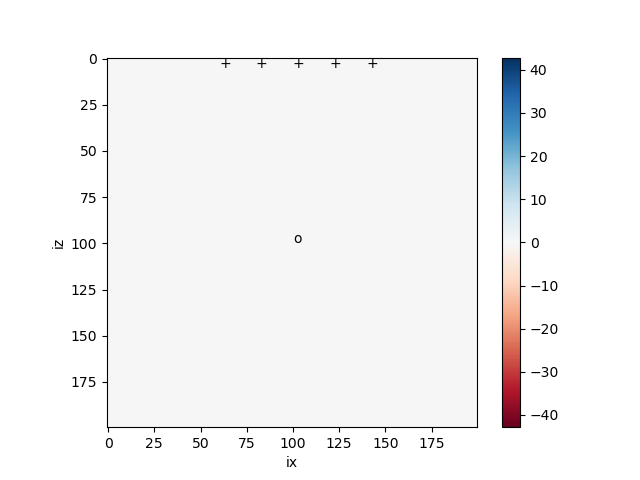

In [5]:
# Plot preparation
unew = np.zeros((nz, nx))
v = max([np.abs(src.min()), np.abs(src.max())])
# Initialize animated plot

fig, ax = plt.subplots()

image = plt.imshow(unew, interpolation='nearest', animated=True,
                   vmin=-v, vmax=+v, cmap=plt.cm.RdBu)


# Plot the receivers
for x, z in zip(irx, irz):
    plt.text(x, z, '+')

plt.text(isx, isz, 'o')
plt.colorbar()
plt.xlabel('ix')
plt.ylabel('iz')


plt.ion()
#plt.show(block=False)

# required for seismograms
ir = np.arange(len(irx))

# Output Courant criterion
print("Courant Criterion r :")
print(cmax*dt/dx)

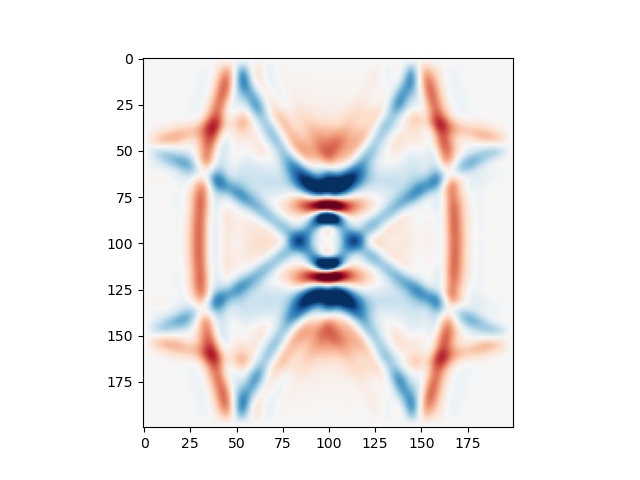

In [6]:
# Initialize pressure at different time steps and the second
# derivatives in each direction
u = np.zeros((nz, nx))
uold = np.zeros((nz, nx))
unew = np.zeros((nz, nx))
uxx = np.zeros((nz, nx))
uzz = np.zeros((nz, nx))

# Plot preparation
unew = np.zeros((nz, nx))
v = max([np.abs(src.min()), np.abs(src.max())])
# Initialize animated plot

fig, ax = plt.subplots()

ims = []
isnap = 10 # increase for a reduced size animation
# required for seismograms
ir = np.arange(len(irx))

# Time extrapolation
for it in range(nt):
    if nop==3:
        # calculate partial derivatives, be careful around the boundaries
        for i in range(1, nx - 1):
            uzz[:, i] = u[:, i + 1] - 2 * u[:, i] + u[:, i - 1]
        for j in range(1, nz - 1):
            uxx[j, :] = u[j - 1, :] - 2 * u[j, :] + u[j + 1, :]

    if nop==5:
        # calculate partial derivatives, be careful around the boundaries
        for i in range(2, nx - 2):
            uzz[:, i] = -1./12*u[:,i+2]+4./3*u[:,i+1]-5./2*u[:,i]+4./3*u[:,i-1]-1./12*u[:,i-2]
        for j in range(2, nz - 2):
            uxx[j, :] = -1./12*u[j+2,:]+4./3*u[j+1,:]-5./2*u[j,:]+4./3*u[j-1,:]-1./12*u[j-2,:]
                    
            
    uxx /= dx ** 2
    uzz /= dx ** 2

    # Time extrapolation
    unew = 2 * u - uold + dt ** 2 * c ** 2 * (uxx + uzz)
    # Add source term at isx, isz
    unew[isz, isx] = unew[isz, isx] + src[it]

    # Plot every isnap-th iteration and save the images
    if it % isnap == 0:    # you can change the speed of the plot by increasing the plotting interval
        im = ax.imshow(unew, animated=True, cmap=plt.cm.RdBu, vmin=-v, vmax=+v, )
        if it == 0:
            ax.imshow(unew, cmap=plt.cm.RdBu, vmin=-v, vmax=+v, )  # show an initial one first
        ims.append([im])

    uold, u = u, unew

    # Save seismograms
    
    seis[ir, it] = u[irz[ir], irx[ir]]

### Animation

Here we use the `ArtistAnimation` function to generate the animation from the previously saved image snapshots. **Note:** this uses a lot of memory and should in principle be performed with the `FuncAnimation` module, though the coding is more complicated. Pleqse see the tutorial [00ani_wave.ipynb](00ani_wave.ipynb)

In [9]:
# generate the animation
import matplotlib.animation as animation
ani = animation.ArtistAnimation(fig, ims , interval=50, blit=True,
                                repeat_delay=1000)

# Save the animation
# ani.save("seismic.mp4")
output_filename = "seismic.mp4"
ani.save(output_filename)#, dpi=300) # for higher resolution
print(f"Animation saved as {output_filename}")

# Display the animation
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
ani

Animation saved as seismic.mp4


The cell below allows you to plot source time function, seismic velocites, and the resulting seismograms in windows inside the notebook. Remember to rerun after you simulated again!

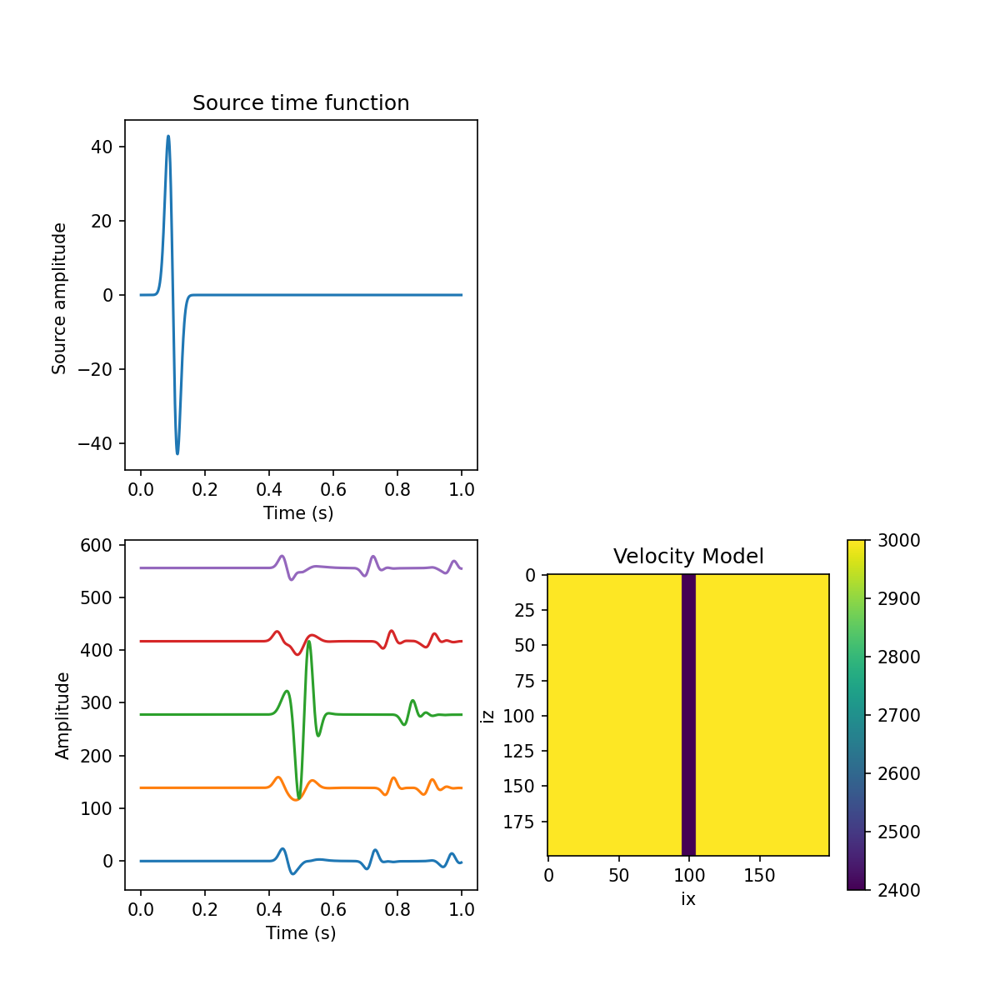

In [10]:
# Plot the source time function and the seismograms 

plt.ioff()
plt.figure(figsize=(8, 8))

plt.subplot(221)
time = np.arange(nt) * dt
plt.plot(time, src)
plt.title('Source time function')
plt.xlabel('Time (s) ')
plt.ylabel('Source amplitude ')

#plt.subplot(222)
#ymax = seis.ravel().max()  
#for ir in range(len(seis)):
#    plt.plot(time, seis[ir, :] + ymax * ir)
#    plt.xlabel('Time (s)')
#    plt.ylabel('Amplitude')

plt.subplot(223)
ymax = seis.ravel().max()
for ir in range(len(seis)):
    plt.plot(time, seis[ir, :] + ymax * ir)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

plt.subplot(224)
# The velocity model is influenced by the Earth model above
plt.title('Velocity Model')
plt.imshow(c)
plt.xlabel('ix')
plt.ylabel('iz')
plt.colorbar()

plt.show()